# Introduction

This course is about music recommendation based on similarities, that is, given a certain music that you like, what are other musics that you will probably like too.

We can see this problem being used by music streaming apps like Spotify.

The techniques here studied can be applied to other scenarios too, like for recommending movies, restaurants, activities, places to travel etc.

Given a dataset of musics we will use the K-means algorithm to create groups (clusters) of similar songs.

We will use Sklearn for clustering, Plotly and Matplotlib for visualizations.

# Data dictionary

Our data came from the spotify api, you can check it out [here](https://developer.spotify.com/documentation/web-api).

Information about some of the fields:

* acousticness: if the music is more or less acoustic
* liveness: if the music was recorded at a live show
* loudness: decibels measure
* speechiness: how voice and talk there is
* tempo: musical pace, BPM Beats Per Minute, rhythm
* valence: how much positive or negative the music is in emotional terms (sad, ..., happy)
* key: tonality of the music, scale of musical notes

In [138]:
import pandas as pd

# Let's see the data
genres = pd.read_csv('data/data_by_genres.csv')
genres.head()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


In [139]:
genres.shape

(2973, 14)

In [140]:
# Let's remove 'mode' and 'key' from the dataset
genres.drop(['mode', 'key'], inplace=True, axis=1)
genres.head()

,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333
1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000
2,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000
3,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882
4,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071


In [141]:
years = pd.read_csv('data/data_by_year.csv')
years.head()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.205710,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.240720,-19.275282,0.116655,100.884521,0.535549,0.140845,10
2,1,1923,0.957247,0.577341,177942.362162,0.262406,0.371733,0.227462,-14.129211,0.093949,114.010730,0.625492,5.389189,0
3,1,1924,0.940200,0.549894,191046.707627,0.344347,0.581701,0.235219,-14.231343,0.092089,120.689572,0.663725,0.661017,10
4,1,1925,0.962607,0.573863,184986.924460,0.278594,0.418297,0.237668,-14.146414,0.111918,115.521921,0.621929,2.604317,5


In [142]:
years.shape

(100, 14)

In [143]:
# Remove unnecessary fields from years too
years.drop(['mode', 'key'], inplace=True, axis=1)
years.head()

,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.205710,-17.048667,0.073662,101.531493,0.379327,0.653333
1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.240720,-19.275282,0.116655,100.884521,0.535549,0.140845
2,1923,0.957247,0.577341,177942.362162,0.262406,0.371733,0.227462,-14.129211,0.093949,114.010730,0.625492,5.389189
3,1924,0.940200,0.549894,191046.707627,0.344347,0.581701,0.235219,-14.231343,0.092089,120.689572,0.663725,0.661017
4,1925,0.962607,0.573863,184986.924460,0.278594,0.418297,0.237668,-14.146414,0.111918,115.521921,0.621929,2.604317


In [144]:
# What are the unique years in this 'years' dataset
years['year'].unique()
# In this dataset we have a range of years from 1921 to 2020 whereas in the 'total'
# dataset we have a range from 2000 to 2020. So, let's remove the years before 2000

array([1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931,
       1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942,
       1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953,
       1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964,
       1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975,
       1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986,
       1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020])

In [145]:
# Removing years below 2000
years = years[years['year'] >= 2000]
# Let's see the unique years again
years['year'].unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020])

In [146]:
# Watching the data inside 'years'
years.head()

,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
79,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049
80,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125
81,2002,0.282624,0.576160,239503.283000,0.641270,0.088048,0.193911,-7.686640,0.084308,119.239738,0.542397,48.655500
82,2003,0.256471,0.575763,244670.575230,0.660165,0.083049,0.196976,-7.485545,0.093926,120.914622,0.530504,48.626407
83,2004,0.280559,0.567680,237378.708037,0.648868,0.077934,0.202199,-7.601655,0.094239,121.290346,0.524489,49.273143


In [147]:
# At this point the indexes of 'years' are misaligned, so we need to reset the index
years.reset_index()
# When we reset the index a new column is added to the dataset to store the past indices

,index,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,79,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049
1,80,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125
2,81,2002,0.282624,0.576160,239503.283000,0.641270,0.088048,0.193911,-7.686640,0.084308,119.239738,0.542397,48.655500
3,82,2003,0.256471,0.575763,244670.575230,0.660165,0.083049,0.196976,-7.485545,0.093926,120.914622,0.530504,48.626407
4,83,2004,0.280559,0.567680,237378.708037,0.648868,0.077934,0.202199,-7.601655,0.094239,121.290346,0.524489,49.273143
5,84,2005,0.255764,0.572281,237229.588205,0.653209,0.090194,0.190082,-7.466159,0.093334,121.617967,0.532531,50.953333
6,85,2006,0.279986,0.568230,234042.914359,0.650326,0.077701,0.188289,-7.265501,0.085847,121.798615,0.520028,51.313846
7,86,2007,0.254081,0.563414,241049.962564,0.668305,0.072957,0.196127,-7.044536,0.084347,124.087516,0.516794,51.075897
8,87,2008,0.249192,0.579193,240107.315601,0.671461,0.063662,0.198431,-6.843804,0.077356,123.509934,0.527542,50.630179
9,88,2009,0.261929,0.564190,238140.013265,0.670749,0.075872,0.205252,-7.046015,0.085458,123.463808,0.507170,51.440816


Datasets genre and year are basically the same except for the genres and years columns.

In [148]:
total = pd.read_csv('data/total_data.csv')
total.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady


In [149]:
total.shape

(20311, 19)

The total dataset has the columns 'year, artists, explicit, id, name, artists_song' that differ from the first two datasets. 

In [150]:
# Let's see what are the years that exist on 'total' dataset
total['year'].unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020])

In [151]:
# Let's remove some columns that may not aggregate too much on the clustering process
# explicit: because it divides all the dataset in two parts
# key
# mode
total.drop(['explicit', 'key', 'mode'], inplace=True, axis=1)
total.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady


In [152]:
# Now let's see how much null entry there are in each column
total.isnull().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
id                  0
instrumentalness    0
liveness            0
loudness            0
name                0
popularity          0
speechiness         0
tempo               0
artists_song        0
dtype: int64

In [153]:
# And let's see if there are Na (not a number)
total.isna().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
id                  0
instrumentalness    0
liveness            0
loudness            0
name                0
popularity          0
speechiness         0
tempo               0
artists_song        0
dtype: int64

# Graphical analysis 

In [154]:
import plotly.express as px

# Let's create a figure plotting the variation of loudness over the years
fig = px.line(years, x='year', y='loudness', markers=True, title='Loudness through the years')
fig.show()

In [155]:
# Now, let's see the duration over the years
fig2 = px.line(years, x='year', y='duration_ms', markers=True, title='Music duration over the years')
fig2.show()

In [156]:
# Let's improve the visualization transforming from milliseconds to seconds (divide ms for 1000 to obtain seconds)
years_second = years  # Creating another dataframe to not change the original one
years_second['duration_s'] = years['duration_ms']/1000
# drop the column in milliseconds format
years_second.drop(['duration_ms'], axis=1, inplace=True)
fig3 = px.line(years_second, x='year', y='duration_s', markers=True, title='Music duration over the years')
fig3.show()

In [157]:
import plotly.graph_objects as go

# Now let's create a plot with more then one variable, let's plot:
# Acousticness
# Valence
# Danceability
# Energy
# Instrumentalness
# Liveness
# Speechiness

fig4 = go.Figure()

fig4.add_trace(go.Scatter(x=years['year'], y=years['acousticness'], name='Acousticness'))
fig4.add_trace(go.Scatter(x=years['year'], y=years['valence'], name='Valence'))
fig4.add_trace(go.Scatter(x=years['year'], y=years['danceability'], name='Danceability'))
fig4.add_trace(go.Scatter(x=years['year'], y=years['energy'], name='Energy'))
fig4.add_trace(go.Scatter(x=years['year'], y=years['instrumentalness'], name='Instrumentalness'))
fig4.add_trace(go.Scatter(x=years['year'], y=years['liveness'], name='Liveness'))
fig4.add_trace(go.Scatter(x=years['year'], y=years['speechiness'], name='Speechiness'))

fig4.show()

In [158]:
# Now let's analyse the correlation between the variables of the 'years' dataset
fig5 = px.imshow(years.corr(), text_auto=True)
fig5.show()
# In the figure we have that yellow boxes indicate a hight correlation
# The boxes above the diagonal principal are a mirror of the boxes bellow the diagonal principal, so we can look only to the upper boxes
# The principal diagonal contain the correlation of each variable with itself, that naturally is 1 (maximum)
# Aside from that we some other variables with hight correlation, like:
# year x popularity
# danceability x speechiness
# loudness x tempo
# speechiness x popularity
# On the other hand blue boxes indicate a negative correlation, as we can see
# in [danceability x duration_s] 

# Clustering by genre
## PCA (Principal Component Analysis) and Standard Scaler

**PCA** is a technique to form a rank of the features that have greater representability of the dataset. It's use case is for datasets with a hight number of features. PCA makes possible to reduce the number of features with a minimized information loss, this makes it easier to visually analyze the data.

**Standard Scaler** is an sklearn's module. Scaling is a technique for standardizing features by removing the mean and scaling to unit variance. This technique makes the input data be in a consistent range, usually between 0 and 1, or, -1 and 1. It ensures that all features have similar impact on the model during training.

In [159]:
genres.shape

(2973, 12)

In [160]:
# Let's see if each line in the 'genre' dataset represents a unique genre
genres['genres'].value_counts().sum()
# Each line represent a different genre

2973

In [161]:
# As we have so much different genres let's create a new version of the dataset without it
genres2 = genres.drop(columns=['genres'], axis=1)
genres2.head()

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333
1,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000
2,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000
3,0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882
4,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071


## Pipelines

To apply PCA and Standard scaling we will use sklearn's pipeline.

**A pipeline:** The purpose of the pipeline is to assemble several steps that can be cross-validated together while setting different parameters.

In [162]:
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

SEED = 42  # seed for randomness reproducibility

# set seed for numpy too
np.random.seed(SEED)

# The following pipeline will standardize the data, then perform the Principal Component Analysis (PCA) to reduce the dataset dimensionality.
# n_components indicates that we want the result to have 2 columns
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('pca', PCA(n_components=2, random_state=SEED))])

# Now we treat the pca_pipeline as a common model

# Transformed data
genre_embedding_pca = pca_pipeline.fit_transform(genres2)

# Get the two PCA components as x and y coordinates of the transformed data
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding_pca)
projection.head()

,x,y
0,5.910268,-0.011146
1,2.787093,4.498483
2,-0.757538,-1.258495
3,1.020521,-0.931690
4,0.753911,-0.999861


## Normalization vs Standardization

These are two popular techniques to scale data.

**Normalization:** Each data point is scaled to the interval [0, 1]. It's equation is:

y = (x-min())/(max()-min())

**Standardization:** For each data point we subtract the mean and divide by the standard deviation. The resulting mean will be 0 and the standard deviation will be 1. It's equation is:

y = (x-mean())/std()

Where:

mean() = sum(x)/count(x)

std() = sqrt(sum(x-mean()**2))/count(x)

It is expected that the data distribution is normal (a gaussian distribution).

So, if the data distribution is normal, we use standardization, otherwise, we use normalization.

# K-means

Algorithm that partition n observations into k clusters in which each observation belongs to the cluster with the nearest mean.

In [163]:
from sklearn.cluster import KMeans

# Instantiate KMeans aiming to separate the dataset into 5 clusters
kmeans_pca = KMeans(n_clusters=5, verbose=1, random_state=SEED)

# Now we fit projection (data with reduced dimensionality) to KMeans model.
kmeans_pca.fit(projection)

# Now let's make predictions and save these on the genres dataset
# The cluster_pca column will contain the cluster number
genres['cluster_pca'] = kmeans_pca.predict(projection)
# Let's save the cluster identification on the projection dataset too
projection['cluster_pca'] = kmeans_pca.predict(projection)

/Users/danielgaio/.local/share/virtualenvs/python-ia-study-wV_J2Woc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Initialization complete
Iteration 0, inertia 4535.437209782149.
Iteration 1, inertia 3911.3084948880687.
Iteration 2, inertia 3736.496286247786.
Iteration 3, inertia 3654.6591321184883.
Iteration 4, inertia 3620.1501748732408.
Iteration 5, inertia 3601.891590943457.
Iteration 6, inertia 3591.2541794666095.
Iteration 7, inertia 3583.6862922587075.
Iteration 8, inertia 3577.7168392779395.
Iteration 9, inertia 3573.87885178781.
Iteration 10, inertia 3572.5574673063165.
Iteration 11, inertia 3571.259386661952.
Iteration 12, inertia 3569.5621483995556.
Iteration 13, inertia 3567.6528657029266.
Iteration 14, inertia 3566.384288236598.
Iteration 15, inertia 3565.3487153706756.
Iteration 16, inertia 3564.4161956200387.
Iteration 17, inertia 3563.350707327745.
Iteration 18, inertia 3562.108841690335.
Iteration 19, inertia 3560.8567117152534.
Iteration 20, inertia 3560.1003473312494.
Iteration 21, inertia 3559.115918005045.
Iteration 22, inertia 3558.156420591141.
Iteration 23, inertia 3557.0710

In [164]:
# Let's watch the genres dataset
genres.head()

,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,cluster_pca
0,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,1
1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,1
2,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,4
3,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,0
4,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,0


In [165]:
# And let's watch the projection dataset
projection.head()

,x,y,cluster_pca
0,5.910268,-0.011146,1
1,2.787093,4.498483,1
2,-0.757538,-1.258495,4
3,1.020521,-0.931690,0
4,0.753911,-0.999861,0


In [166]:
# Let's save the genres names on the projection dataset for better visualization
projection['genres'] = genres['genres']
projection.head()
# Now we can use the projection dataset to plot graphical visualizations

,x,y,cluster_pca,genres
0,5.910268,-0.011146,1,21st century classical
1,2.787093,4.498483,1,432hz
2,-0.757538,-1.258495,4,8-bit
3,1.020521,-0.931690,0,[]
4,0.753911,-0.999861,0,a cappella


# Plotting the clusters

In [167]:
# In this plot we have the principal components (x, y). The colors of the dots are based on the cluster.
# And on mouse hover we show all the information (columns) of the respective dot.

fig6 = px.scatter(
    projection,
    x='x',
    y='y',
    color='cluster_pca',
    hover_data=['x', 'y', 'cluster_pca', 'genres']  # data to be shown on mouse hover
)

fig6.show()

In [168]:
# The second element of the pipeline that we created earlier is the PCA transformer.
# Let's see the explained variance ratio of this transformer
# This will show the percentage of variance explained by each principal component (in our case two principal components (or columns))
# The first PC explains 34% of the variance
# And the second PC explains 14%
pca_pipeline[1].explained_variance_ratio_

array([0.34986105, 0.14284565])

In [169]:
# Now, the total percentage of the data that is explained is 49.2% from the original dataset
pca_pipeline[1].explained_variance_ratio_.sum()

0.492706699472664

In [170]:
# This is another parameter that tells us the amount of variance explained by each column
pca_pipeline[1].explained_variance_

array([3.84976644, 1.57183087])

# Testing with ten clusters

In [171]:
genre_embedding_pca

array([[ 5.91026811, -0.01114629],
       [ 2.78709315,  4.49848304],
       [-0.75753754, -1.25849505],
       ...,
       [-0.83251119, -1.08972557],
       [ 1.77479003, -3.69523275],
       [-1.02806916, -1.39070855]])

In [172]:
kmeans_pca2 = KMeans(n_clusters=10, verbose=0, random_state=SEED)
projection2 = pd.DataFrame(columns=['x', 'y'], data=genre_embedding_pca)
kmeans_pca2.fit(projection2)
projection2['cluster_pca'] = kmeans_pca2.predict(projection2)
projection2['genres'] = genres['genres']
projection2.head()

/Users/danielgaio/.local/share/virtualenvs/python-ia-study-wV_J2Woc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,x,y,cluster_pca,genres
0,5.910268,-0.011146,8,21st century classical
1,2.787093,4.498483,7,432hz
2,-0.757538,-1.258495,1,8-bit
3,1.020521,-0.931690,4,[]
4,0.753911,-0.999861,1,a cappella


In [173]:
fig7 = px.scatter(
    projection2,
    x='x',
    y='y',
    color='cluster_pca',
    hover_data=['x', 'y', 'cluster_pca', 'genres']
)
fig7.show()
# As we can see in the plotted data now we have 10 clusters

# Clustering by music

In [174]:
# Let's remember the total dataset
total.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady


In [175]:
# How many times each artist appears in the total dataset
total['artists'].value_counts()
# We can see that there are 875 different artists

artists
Drake                   170
Taylor Swift            156
Eminem                  147
Kanye West              136
BTS                     122
                       ... 
Of Monsters and Men       7
The Living Tombstone      7
Clean Bandit              7
Nelly Furtado             6
Empire of the Sun         6
Name: count, Length: 875, dtype: int64

In [176]:
# Now, how many musics there are
total['artists_song'].value_counts()
# There are 20311 musics

artists_song
Coldplay - Yellow                                                   1
Juice WRLD - Intro                                                  1
Carrie Underwood - The Champion - Bonus Track                       1
YoungBoy Never Broke Again - Cross Me (feat. Lil Baby and Plies)    1
Twenty One Pilots - Morph                                           1
                                                                   ..
Taylor Swift - Come Back...Be Here                                  1
Banda El Recodo - Me Gusta Todo De Ti                               1
Michael Bublé - The Christmas Song                                  1
Glee Cast - Smooth Criminal (Glee Cast Version) (feat. 2CELLOS)     1
Eminem - Darkness                                                   1
Name: count, Length: 20311, dtype: int64

In [177]:
from sklearn.preprocessing import OneHotEncoder

# Let's one hot encode the artists
ohe = OneHotEncoder(dtype=int)
ohe_columns = ohe.fit_transform(total[['artists']]).toarray()
# Let's make a copy of total to preserve the original dataset
# We will drop the artists column because it will be replaced by the one hot encoded one
total2 = total.drop('artists', axis=1)

total_music_ohe = pd.concat(
    [total2, pd.DataFrame(ohe_columns, columns=ohe.get_feature_names_out(['artists']))],
    axis=1
)
# The columns parameter serves to use the artists names as columns names for the one hot encoded columns that are created
total_music_ohe

,valence,year,acousticness,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,...,artists_Zara Larsson,artists_Zedd,artists_alt-J,artists_blackbear,artists_blink-182,artists_deadmau5,artists_for KING & COUNTRY,artists_fun.,artists_girl in red,artists_iann dior
0,0.285,2000,0.00239,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,...,0,0,0,0,0,0,0,0,0,0
1,0.613,2000,0.14300,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,...,0,0,0,0,0,0,0,0,0,0
2,0.400,2000,0.00958,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,...,0,0,0,0,0,0,0,0,0,0
3,0.543,2000,0.00664,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,...,0,0,0,0,0,0,0,0,0,0
4,0.760,2000,0.03020,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,0.187,2020,0.57400,0.445,176250,0.330,0PUkanqCGTb6qseXPKOw1F,0.000000,0.1020,-8.121,...,0,0,0,0,0,0,0,0,0,0
20307,0.240,2020,0.81500,0.467,179188,0.429,6Iw6fQVKZi0fWtEQBrTFcP,0.000052,0.1770,-8.689,...,0,0,0,0,0,0,0,0,0,0
20308,0.466,2020,0.31000,0.562,253613,0.686,308prODCCD0O660tIktbUi,0.022500,0.1250,-8.480,...,0,0,0,0,0,0,0,0,0,0
20309,0.522,2020,0.20400,0.598,230600,0.472,2f8y4CuG57UJEmkG3ujd0D,0.000015,0.1080,-10.991,...,0,0,0,0,0,0,0,0,0,0


**What is OneHotEncoder:** a process of transforming categorical variables into numerical format before fitting and training a machine learning algorithm. For each unique value on a column, a new column is created.

In [178]:
print(total.shape)
print(total_music_ohe.shape)
# Before we has 16 columns, now we have 890 columns

(20311, 16)
(20311, 890)


## PCA

In [179]:
# Now we create a pca pipeline to reduce the dimensionality of that ohe data
# n_components=0.7 means that we will keep 70% of the data
pca_pipeline2 = Pipeline([('scaler', StandardScaler()), ('pca', PCA(n_components=0.7, random_state=SEED))])

# Removing non numerical columns
# Applying the PCA
music_embedding_pca = pca_pipeline2.fit_transform(
    total_music_ohe.drop(['id', 'name', 'artists_song'], axis=1)
)

# This time we're not passing column names because there too many
music_projection = pd.DataFrame(data=music_embedding_pca)

In [180]:
# How many components did we get?
pca_pipeline2[1].n_components_
# We got 612. So we reduced the dimensionality from 890 to 612. And that represents 70% of the data

612

## Applying Kmeans on PCA data

In [181]:
# Create a KMeans object
kmeans_pca = KMeans(n_clusters=50, verbose=True, random_state=SEED)
# Fit to generate clusters based on the PCA data
kmeans_pca.fit(music_projection)

# Add cluster's data to the original dataset
total['cluster_pca'] = kmeans_pca.predict(music_projection)
music_projection['cluster_pca'] = kmeans_pca.predict(music_projection)

/Users/danielgaio/.local/share/virtualenvs/python-ia-study-wV_J2Woc/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Initialization complete
Iteration 0, inertia 12135525.920096926.
Iteration 1, inertia 11586518.563028244.
Iteration 2, inertia 11576613.412112536.
Iteration 3, inertia 11572298.044671897.
Iteration 4, inertia 11570820.55894825.
Iteration 5, inertia 11569864.933136186.
Iteration 6, inertia 11569114.7107254.
Iteration 7, inertia 11568654.62333054.
Iteration 8, inertia 11568272.889534857.
Iteration 9, inertia 11568089.58256371.
Iteration 10, inertia 11568007.774361797.
Iteration 11, inertia 11567900.945084048.
Iteration 12, inertia 11567786.25900094.
Iteration 13, inertia 11567546.676516406.
Iteration 14, inertia 11567332.605380384.
Iteration 15, inertia 11567238.585681371.
Iteration 16, inertia 11567156.15014296.
Iteration 17, inertia 11567068.28691424.
Iteration 18, inertia 11566996.474044167.
Iteration 19, inertia 11566959.262738835.
Iteration 20, inertia 11566940.4802377.
Iteration 21, inertia 11566909.14041387.
Iteration 22, inertia 11566863.798384372.
Iteration 23, inertia 11566826.

In [182]:
# Add music information to the projection
music_projection['artists'] = total['artists']
music_projection['song'] = total['artists_song']

In [183]:
music_projection

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,cluster_pca,artists,song
0,0.174796,0.731252,2.186797,-0.767192,0.594847,0.315968,-0.412322,-0.479171,-2.700668,2.109956,...,-0.009111,0.005154,-0.034027,-0.032617,2.053771e-12,6.878151e-12,5.708366e-12,23,Coldplay,Coldplay - Yellow
1,-1.358420,0.052935,-1.789973,1.938444,0.403606,1.023898,-1.172118,0.821698,-1.716897,0.252498,...,-0.031986,0.029708,-0.016322,-0.030234,6.651313e-12,4.388760e-12,4.236478e-12,10,OutKast,OutKast - Ms. Jackson
2,-0.972077,0.658094,0.757500,-0.277350,-0.400393,0.402941,1.292960,1.839192,-1.562236,1.410677,...,0.017097,0.017361,-0.010979,-0.012781,2.824263e-12,8.035513e-14,5.131689e-12,23,Linkin Park,Linkin Park - In the End
3,-0.926464,1.292091,0.398499,-0.997738,0.202219,0.620859,-0.527689,1.135529,-1.343893,1.020964,...,0.089337,0.164777,-0.064148,-0.040911,7.944691e-12,9.882671e-12,2.544774e-11,23,3 Doors Down,3 Doors Down - Kryptonite
4,-1.710077,-0.383502,-1.258562,1.346428,1.223591,1.744579,0.094311,0.479412,-2.125376,0.389565,...,-0.011937,-0.004081,-0.017478,-0.010033,-5.262236e-13,3.224716e-12,7.054273e-13,7,Eminem,Eminem - The Real Slim Shady
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,1.346699,-2.775889,0.986755,-1.704967,0.103935,-0.726582,0.253808,0.520234,-0.064513,0.204971,...,-0.235355,-0.054256,0.016922,-0.125947,6.970037e-11,2.149282e-11,-2.141473e-11,10,Bazzi,Bazzi - I Don't Think I'm Okay
20307,1.269387,-2.444619,0.971408,-0.115303,-0.719597,-1.823579,-0.545186,-1.475719,-0.338390,0.272129,...,-0.183026,0.074605,0.005622,0.000054,-3.313215e-11,1.737770e-11,-7.248678e-12,10,Bryson Tiller,Bryson Tiller - Timeless Interlude
20308,0.781916,-1.164865,0.705256,-0.947160,1.145828,-0.472667,-0.356604,0.972512,0.900317,-0.674016,...,-0.033420,-0.157564,0.213849,-0.065180,6.932526e-11,-6.240957e-11,-2.009412e-11,41,Fleet Foxes,Fleet Foxes - Sunblind
20309,0.002454,-3.056407,-0.272934,1.436355,-0.604453,0.251492,-1.361710,-0.633245,0.280076,0.521145,...,-0.784640,0.080684,0.038379,0.108493,-4.666733e-11,8.596652e-11,2.263665e-12,10,Gunna,Gunna - NASTY GIRL / ON CAMERA


## Analyzing the cluster

In [184]:
# Let's plot the clusters
# Plotting columns 0 and 1. These are the two principal components, that explain higher percentages of the significance of the dataset data
fig8 = px.scatter(
    music_projection,
    x=0,
    y=1,
    color='cluster_pca',
    hover_data=[0, 1, 'song']
)
fig8.show()
# As we can see, despite having 50 clusters, we can only distinguish 3 colors clearly. So, this view is not very useful

In [185]:
# Let's see how much of the variance is explained (we expect it to be 0.7)
pca_pipeline2[1].explained_variance_ratio_.sum()

0.700000846318703

In [186]:
# Now the variance number
pca_pipeline2[1].explained_variance_.sum()

620.931321868869

In [187]:
# Plotting the cluster in 3D
fig9 = px.scatter_3d(
    music_projection,
    x=0,
    y=1,
    z=2,
    color='cluster_pca',
    hover_data='song'
)
fig9.update_traces(marker_size=2)
fig9.show()

## Recommending musics

In [188]:
# Let's get recommendations of musics that are similar to music_name
music_name = 'Ed Sheeran - Shape of You'

# To recommend new musics
# 1 - Find out in which cluster is the music
# 2 - Get musics near our music in that cluster

In [189]:
music_projection.head()
# Our music_name can be found on the song column of the music_projection dataset

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,cluster_pca,artists,song
0,0.174796,0.731252,2.186797,-0.767192,0.594847,0.315968,-0.412322,-0.479171,-2.700668,2.109956,...,-0.009111,0.005154,-0.034027,-0.032617,2.053771e-12,6.878151e-12,5.708366e-12,23,Coldplay,Coldplay - Yellow
1,-1.358420,0.052935,-1.789973,1.938444,0.403606,1.023898,-1.172118,0.821698,-1.716897,0.252498,...,-0.031986,0.029708,-0.016322,-0.030234,6.651313e-12,4.388760e-12,4.236478e-12,10,OutKast,OutKast - Ms. Jackson
2,-0.972077,0.658094,0.757500,-0.277350,-0.400393,0.402941,1.292960,1.839192,-1.562236,1.410677,...,0.017097,0.017361,-0.010979,-0.012781,2.824263e-12,8.035513e-14,5.131689e-12,23,Linkin Park,Linkin Park - In the End
3,-0.926464,1.292091,0.398499,-0.997738,0.202219,0.620859,-0.527689,1.135529,-1.343893,1.020964,...,0.089337,0.164777,-0.064148,-0.040911,7.944691e-12,9.882671e-12,2.544774e-11,23,3 Doors Down,3 Doors Down - Kryptonite
4,-1.710077,-0.383502,-1.258562,1.346428,1.223591,1.744579,0.094311,0.479412,-2.125376,0.389565,...,-0.011937,-0.004081,-0.017478,-0.010033,-5.262236e-13,3.224716e-12,7.054273e-13,7,Eminem,Eminem - The Real Slim Shady


In [190]:
# Let's get the cluster number that corresponds to our music
cluster = list(music_projection[music_projection['song'] == music_name]['cluster_pca'])[0]
print(f"The music {music_name} belongs to cluster {cluster} ")
# Now that we know the cluster number we can get other musics from that cluster
# We are getting columns: 0, 1 and 'song'
recommended_musics = music_projection[music_projection['cluster_pca'] == cluster][[0, 1, 'song']]
recommended_musics

The music Ed Sheeran - Shape of You belongs to cluster 10 


,0,1,song
1,-1.358420,0.052935,OutKast - Ms. Jackson
6,-1.241322,0.534152,Nelly - Ride Wit Me
8,-1.787253,1.482026,*NSYNC - Bye Bye Bye
9,-1.517607,0.312714,Britney Spears - Oops!...I Did It Again
12,-1.324236,0.187384,Shaggy - It Wasn't Me
...,...,...,...
20303,-1.682054,-2.580833,"Rauw Alejandro - Elegí (feat. Farruko, Anuel A..."
20304,-1.290731,-3.601878,Polo G - Trials & Tribulations
20306,1.346699,-2.775889,Bazzi - I Don't Think I'm Okay
20307,1.269387,-2.444619,Bryson Tiller - Timeless Interlude


In [191]:
# Let's get the coordinates of our music
x_music = list(music_projection[music_projection['song'] == music_name][0])[0]
y_music = list(music_projection[music_projection['song'] == music_name][1])[0]
x_music, y_music

(-0.8269542902310576, -2.9396914072890383)

In [192]:
from sklearn.metrics.pairwise import euclidean_distances

# Calculating the euclidean distances between our music and the other musics in the cluster
distances = euclidean_distances(recommended_musics[[0, 1]], [[x_music, y_music]])
recommended_musics['distances'] = distances
distances

array([[3.03945225],
       [3.4984697 ],
       [4.52479394],
       ...,
       [2.179816  ],
       [2.15400609],
       [0.83757995]])

In [193]:
# Let's add the id of each music to recommended_musics
recommended_musics['id'] = total['id']
recommended_musics

,0,1,song,distances,id
1,-1.358420,0.052935,OutKast - Ms. Jackson,3.039452,0I3q5fE6wg7LIfHGngUTnV
6,-1.241322,0.534152,Nelly - Ride Wit Me,3.498470,3Gf5nttwcX9aaSQXRWidEZ
8,-1.787253,1.482026,*NSYNC - Bye Bye Bye,4.524794,62bOmKYxYg7dhrC6gH9vFn
9,-1.517607,0.312714,Britney Spears - Oops!...I Did It Again,3.324927,6naxalmIoLFWR0siv8dnQQ
12,-1.324236,0.187384,Shaggy - It Wasn't Me,3.166369,3WkibOpDF7cQ5xntM1epyf
...,...,...,...,...,...
20303,-1.682054,-2.580833,"Rauw Alejandro - Elegí (feat. Farruko, Anuel A...",0.927348,3oCghu20Kto5Xcu8Pg0cit
20304,-1.290731,-3.601878,Polo G - Trials & Tribulations,0.808443,6V1Jx3o0S2MtBI9yIDXsJS
20306,1.346699,-2.775889,Bazzi - I Don't Think I'm Okay,2.179816,0PUkanqCGTb6qseXPKOw1F
20307,1.269387,-2.444619,Bryson Tiller - Timeless Interlude,2.154006,6Iw6fQVKZi0fWtEQBrTFcP


In [194]:
# Ordering the musics by their distances, from the closest to the furthest
recommendation = recommended_musics.sort_values('distances').head(10)
recommendation

,0,1,song,distances,id
2463,-0.826954,-2.939691,Ed Sheeran - Shape of You,0.000000,7qiZfU4dY1lWllzX7mPBI3
2826,-0.831891,-2.941406,Juice WRLD - Hear Me Calling,0.005226,13ZyrkCDmRz5xY3seuAWYk
13421,-0.826575,-2.915302,$uicideBoy$ - For the Last Time,0.024393,240audWazVjwvwh7XwfSZE
2942,-0.863727,-2.965997,Marshmello - Be Kind (with Halsey),0.045213,3Z8FwOEN59mRMxDCtb8N0A
17093,-0.792448,-2.974369,Joyner Lucas - Will - Remix,0.048920,6WI33r2QRxyxttn3KH0XkC
5371,-0.874338,-2.927113,The Kid LAROI - WRONG (feat. Lil Mosey),0.049025,1EWkw4Fa6IlnsAihLUlFFM
13682,-0.878031,-2.944654,YoungBoy Never Broke Again - House Arrest Tingz,0.051317,4Boj4bBiDv6Ur1zKEvLXBI
15392,-0.792012,-2.987829,$uicideBoy$ - Putrid Pride,0.059483,4CwA4CdTQqNv18QSAW3Srk
15388,-0.784530,-2.897926,Pop Smoke - Paranoia (feat. Gunna & Young Thug),0.059533,3QqJ44HiM84iyZS0G2IKIP
5271,-0.789801,-2.986457,Ed Sheeran - South of the Border (feat. Camila...,0.059728,4vUmTMuQqjdnvlZmAH61Qk


## Spotipy library

To install the lib:

pip install spotipy

How to use environment variables:

Install python-dotenv library:

> pip install python-dotenv

Create a file named .env in the same directory of this file

In [195]:
import os
import spotipy
from spotipy.oauth2 import SpotifyOAuth
from spotipy.oauth2 import SpotifyClientCredentials
from dotenv import load_dotenv

# Load environment variables
load_dotenv()

# Now we need to get the client ID and client secret from the spotify developer account
scope = "user-library-read playlist-modify-private"
OAuth = SpotifyOAuth(
    scope=scope,
    redirect_uri='http://localhost:5000/calback',
    client_id=os.getenv('CLIENT_ID'),
    client_secret=os.getenv('CLIENT_SECRET')
)

In [196]:
client_credentials_manager = SpotifyClientCredentials(
    client_id=os.getenv('CLIENT_ID'),
    client_secret=os.getenv('CLIENT_SECRET')
)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

## Music album image

For that we will need to install skimage

> pip install scikit-image

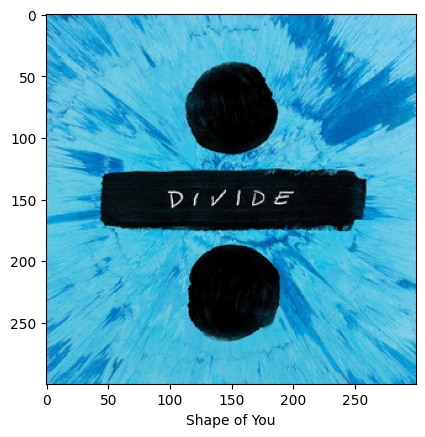

In [197]:
import matplotlib.pyplot as plt
from skimage import io

# We find musics on spotify api by their id
# Getting the id of our music
id = total[total['artists_song'] == music_name]['id'].iloc[0]

# Request to spotify api
track = sp.track(id)

# Extracting data
img_url = track['album']['images'][1]['url']
name = track['name']
img = io.imread(img_url)

# Showing the image
plt.imshow(img)
plt.xlabel(name, fontsize=10)
plt.show()

## Showing recommended musics as a playlist

In [198]:
# Now we can get the images and names of the musics
def get_by_ids(playlist_ids):
    """This function returns the images and names of the musics in a playlist"""
    img_urls = []
    music_names = []
    artists = []
    durations = []

    for id in playlist_ids:
        track = sp.track(id)
        img_urls.append(track['album']['images'][1]['url'])
        music_names.append(track['name'])
        artists.append(track['artists'][0]['name'])
        durations.append(round(track['duration_ms']/60000, 2))

    return img_urls, music_names, artists, durations

In [199]:
# Using the function
img_urls, names, artists, durations = get_by_ids(recommendation['id'])
img_urls, names, artists, durations

(['https://i.scdn.co/image/ab67616d00001e02ba5db46f4b838ef6027e6f96',
  'https://i.scdn.co/image/ab67616d00001e02af149eb4002f65f83afc63c4',
  'https://i.scdn.co/image/ab67616d00001e02f795a2962820664b4112901e',
  'https://i.scdn.co/image/ab67616d00001e02fdf2e993e10e67396b3bf759',
  'https://i.scdn.co/image/ab67616d00001e024ac196312c24faedb76a345e',
  'https://i.scdn.co/image/ab67616d00001e02891f0552bed344dc2bfe322f',
  'https://i.scdn.co/image/ab67616d00001e028bd6e34012a7ab6311050d0c',
  'https://i.scdn.co/image/ab67616d00001e0207aa1426cb2b3cfd8ad67c64',
  'https://i.scdn.co/image/ab67616d00001e0246e1307c35579c3483ea7b03',
  'https://i.scdn.co/image/ab67616d00001e0273304ce0653c7758dd94b259'],
 ['Shape of You',
  'Hear Me Calling',
  'For the Last Time',
  'Be Kind (with Halsey)',
  'Will - Remix',
  'WRONG (feat. Lil Mosey)',
  'House Arrest Tingz',
  'Putrid Pride',
  'Paranoia (feat. Gunna & Young Thug)',
  'South of the Border (feat. Camila Cabello & Cardi B)'],
 ['Ed Sheeran',
  'Ju

In [200]:
# Function to show the musics on a grid
def visualize_songs(img_urls, names, artists, durations):
    plt.figure(figsize=(15, 10))
    columns = 5

    for i, url in enumerate(img_urls):
        # Integer division of the number of urls by the number of columns
        ax = plt.subplot(len(img_urls) // columns+1, columns, i+1)
        # Load img
        image = io.imread(url)
        # Show img
        plt.imshow(image)
        # Remove y axis
        ax.get_yaxis().set_visible(False)
        # Make x ticks invisible
        plt.xticks(color='w', fontsize=0.1)
        # Make y ticks invisible
        plt.yticks(color='w', fontsize=0.1)
        # Add music infos
        infos = names[i] + '\n' + artists[i] + '\n' + str(durations[i]) + ' min'
        plt.xlabel(infos, fontsize=8)
        # Adjust spacing between subplots
        plt.tight_layout(h_pad=0.7, w_pad=0)
        # Adjust spacing between subplots
        plt.subplots_adjust(wspace=None, hspace=None)
        # Customize tick marks making the bottom numeral marking invisible
        plt.tick_params(bottom=False)
        # Remove grid lines
        plt.grid(visible=False)
    
    plt.show()

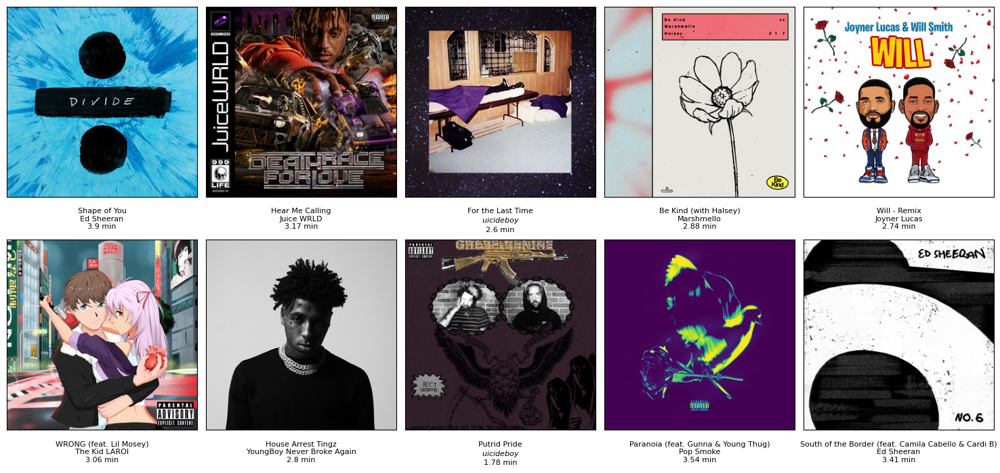

In [201]:
visualize_songs(img_urls, names, artists, durations)

## Creating a unified function for recommendation and exhibition

In [202]:
def recommender(music_name):
    # Calculating the distances
    cluster = list(music_projection[music_projection['song'] == music_name]['cluster_pca'])[0]
    recommended_musics = music_projection[music_projection['cluster_pca'] == cluster][[0, 1, 'song']]
    x_music = list(music_projection[music_projection['song'] == music_name][0])[0]
    y_music = list(music_projection[music_projection['song'] == music_name][1])[0]
    distances = euclidean_distances(recommended_musics[[0, 1]], [[x_music, y_music]])
    recommended_musics['distances'] = distances
    recommended_musics['id'] = total['id']
    recommendation = recommended_musics.sort_values('distances').head(10)

    # Collecting data from spotify api
    img_urls, names, artists, durations = get_by_ids(playlist_ids=recommendation['id'])

    # Plotting recommended musics
    visualize_songs(img_urls=img_urls, names=names, artists=artists, durations=durations)

Run The Jewels - Oh My Darling Don't Cry


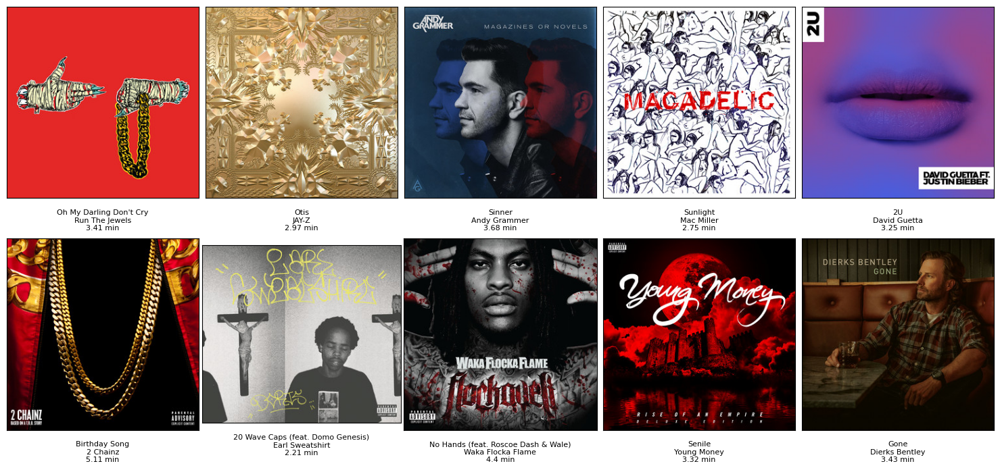

In [205]:
import random

random_music = random.choice(total['artists_song'])
print(random_music)
recommender(music_name=random_music)